In [1]:
import torch
import torch.nn as nn

import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights
import torchvision.transforms as T 

from PIL import Image

from skimage.morphology import flood

from torchvision import models, transforms, utils
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc
from PIL import Image
import json
%matplotlib inline

In [2]:
# load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
mrcnn_model = maskrcnn_resnet50_fpn(weights=weights, progress=False).to(device)
mrcnn_model = mrcnn_model.eval()

In [3]:
# load image, conver to tensor
img = Image.open('./DairyBull_Jan2017_Cryptic/DairyBull_G1_Jan2017.jpg')
transform = T.Compose([T.ToTensor()]) 
img = transform(img)
# pred = mrcnn_model([img])

In [432]:
# create forward hook to get output of intermediate later
# activation = {}
# def get_activation(name):
#     def hook(model, input, output):
#         activation[name] = output
#     return hook

In [433]:
# mrcnn_model.backbone.register_forward_hook(get_activation('backbone'))
# pred = mrcnn_model([img])

In [436]:
# activation['backbone']['pool'].shape

torch.Size([1, 256, 13, 17])

In [4]:
img.shape

torch.Size([3, 3000, 4000])

In [5]:
# get backbone convolution layers and weights

model_weights =[]
conv_layers = []
model_children = list(mrcnn_model.backbone.body.children())

counter = 0

for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)
print(f"Total convolution layers: {counter}")
print(conv_layers)

Total convolution layers: 49
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False), Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False), Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False), Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False), Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False), Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=Fals

In [6]:
# get feature map of each layer
outputs = []
names = []
for layer in conv_layers:
    img = layer(img)
    outputs.append(img)
    names.append(str(layer))
print(len(outputs))

for feature_map in outputs:
    print(feature_map.shape)

49
torch.Size([64, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([256, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([256, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([64, 1500, 2000])
torch.Size([256, 1500, 2000])
torch.Size([128, 1500, 2000])
torch.Size([128, 750, 1000])
torch.Size([512, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([512, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([512, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([128, 750, 1000])
torch.Size([512, 750, 1000])
torch.Size([256, 750, 1000])
torch.Size([256, 375, 500])
torch.Size([1024, 375, 500])
torch.Size([256, 375, 500])
torch.Size([256, 375, 500])
torch.Size([1024, 375, 500])
torch.Size([256, 375, 500])
torch.Size([256, 375, 500])
torch.Size([1024, 375, 500])
torch.Size([256, 375, 500])
torch.Size([256, 375, 500])
torch.Size([1024, 375, 500])
torch.Size([25

In [7]:
# make feature maps 2D for plt
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())
for fm in processed:
    print(fm.shape)

(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(1500, 2000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(750, 1000)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(375, 500)
(188, 250)
(188, 250)
(188, 250)
(188, 250)
(188, 250)
(188, 250)
(188, 250)
(188, 250)


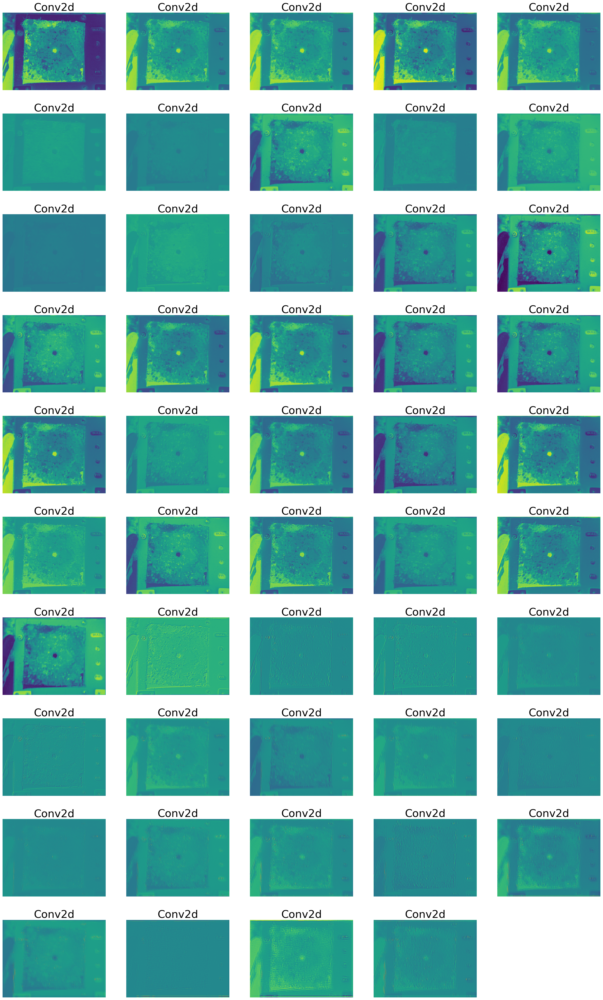

In [8]:
# visualize feature maps
fig = plt.figure(figsize=(30, 50))
for i in range(len(processed)):
    a = fig.add_subplot(10, 5, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=30)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

In [9]:
# upsample feature map to image og size
print(outputs[0].shape)
test_fm = (outputs[0].unsqueeze(0))
m = nn.Upsample(size=[3000,4000], mode='nearest')
test_fm = m(test_fm)
test_fm = test_fm.squeeze(0)
print(test_fm.shape)

torch.Size([64, 1500, 2000])
torch.Size([64, 3000, 4000])


In [10]:
# make feature map 2D for plt
gray_scale = torch.sum(test_fm,0)
gray_scale = gray_scale / test_fm.shape[0]
gray_scale = gray_scale.data.cpu().numpy()

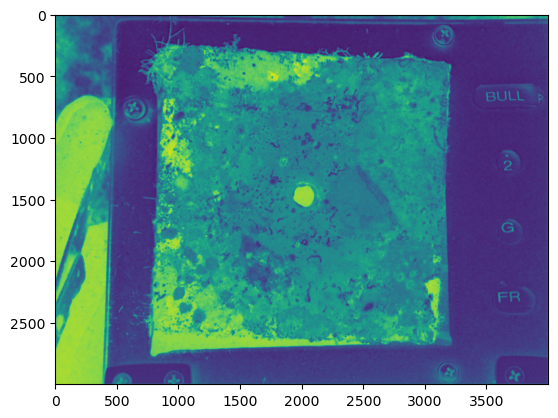

In [11]:
plt.imshow(gray_scale)

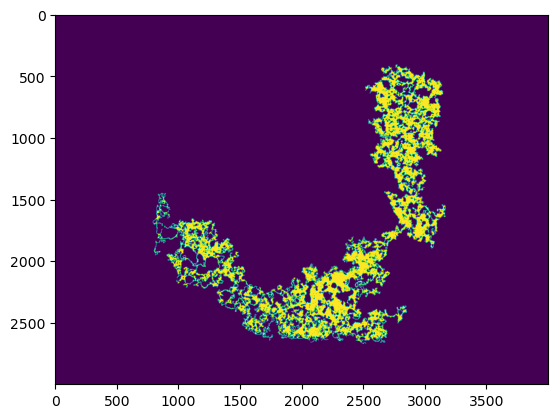

In [16]:
# try skimage flood function for magic wand functionality
mask = flood(gray_scale, (2500, 2500), tolerance=0.005)
mask = mask.astype(int)
plt.imshow(mask)

In [13]:
gray_scale

array([[-0.00064378, -0.00064378, -0.0246352 , ..., -0.01581423,
         0.00075185,  0.00075185],
       [-0.00064378, -0.00064378, -0.0246352 , ..., -0.01581423,
         0.00075185,  0.00075185],
       [-0.01069972, -0.01069972, -0.03725996, ..., -0.03021288,
        -0.01042919, -0.01042919],
       ...,
       [-0.00041261, -0.00041261, -0.00184361, ..., -0.07378188,
        -0.03339454, -0.03339454],
       [-0.00037824, -0.00037824, -0.00069423, ..., -0.04102733,
        -0.02135778, -0.02135778],
       [-0.00037824, -0.00037824, -0.00069423, ..., -0.04102733,
        -0.02135778, -0.02135778]], dtype=float32)

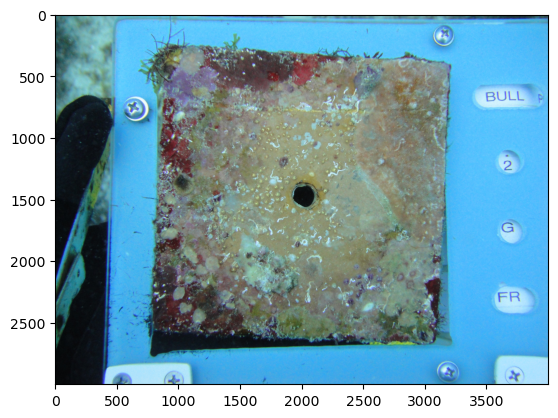

In [14]:
plt.imshow(Image.open('./DairyBull_Jan2017_Cryptic/DairyBull_G1_Jan2017.jpg'))